# OCR

## Preview Result
___

### Keras-OCR

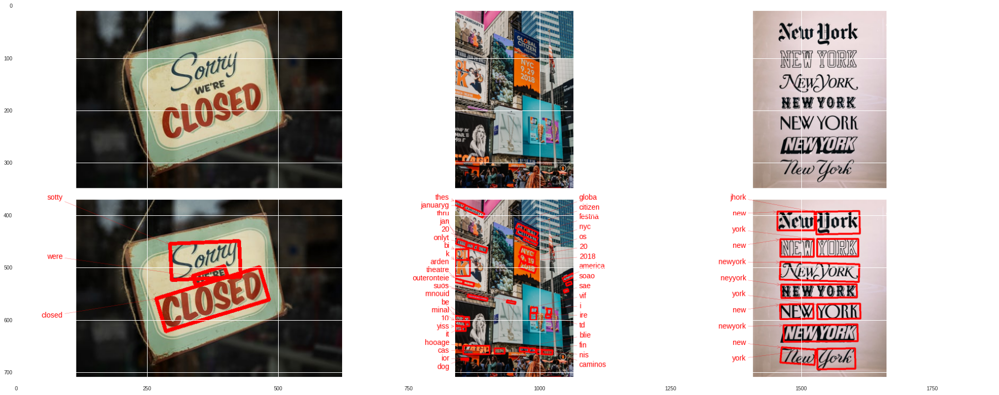

In [ ]:
img = Image.open('./1.png')

plt.figure(figsize=(27, 15))
plt.imshow(img)
plt.tight_layout()

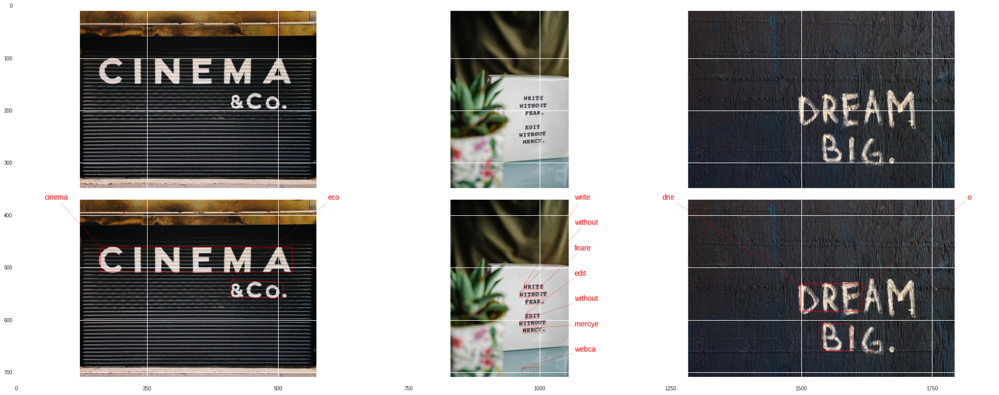

In [ ]:
img = Image.open('./2.png')

plt.figure(figsize=(27, 15))
plt.imshow(img)
plt.tight_layout()

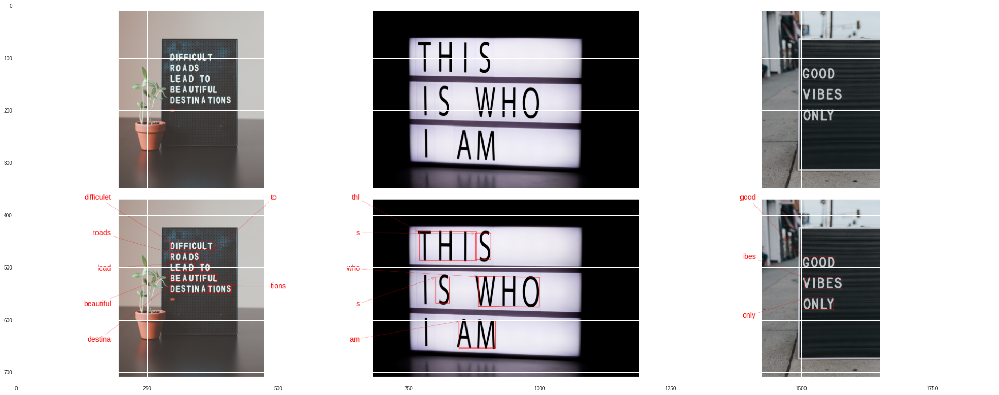

In [ ]:
img = Image.open('./3.png')

plt.figure(figsize=(27, 15))
plt.imshow(img)
plt.tight_layout()

### Tesseract

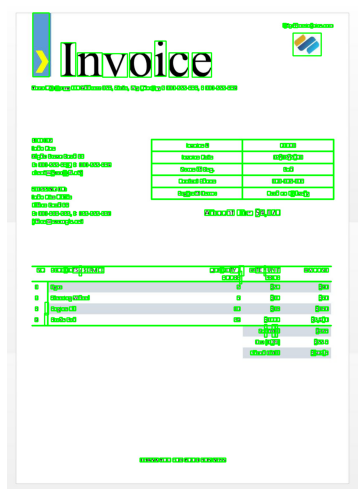

In [ ]:
img = Image.open('./t.png')

plt.figure(figsize=(15, 7))
plt.imshow(img)
plt.axis(False)
plt.tight_layout()

## Index
___


1.   Configuration
2. Module
3. Load Image
4. Get a Kearas-OCR Pipeline & Image
5. Keras Result
2. Tesseract

- 회고



### Configuration

In [ ]:
cd /content/drive/MyDrive/Colab Notebooks/Ex/Ex-12

/content/drive/MyDrive/Colab Notebooks/Ex/Ex-12


#### Install Library

In [ ]:
%%capture
!pip install keras-ocr

In [ ]:
%%capture
!sudo apt install tesseract-ocr
!sudo apt install libtesseract-dev

In [ ]:
%%capture
!pip install pytesseract

In [ ]:
%%capture
!pip install Pillow==8.3.2

### Module

In [ ]:
import os
import sys
import pickle
import random

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
plt.style.use('seaborn')

import warnings
warnings.filterwarnings('ignore')

import tensorflow as tf

In [ ]:
random_seed = 71

random.seed(random_seed)
np.random.seed(random_seed)
tf.random.set_seed(random_seed)

In [ ]:
import keras_ocr
import pytesseract
from pytesseract import Output
from PIL import Image

In [ ]:
!python -V

print(keras_ocr.__version__)
print(pytesseract.__version__)

Python 3.7.13
0.9.1
0.3.9


### Load Image

In [ ]:
import cv2
import urllib.request

def url_to_image(url):
  resp = urllib.request.urlopen(url)
  image = np.asarray(bytearray(resp.read()), dtype='uint8')
  image = cv2.imdecode(image, cv2.IMREAD_COLOR)
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

  return image

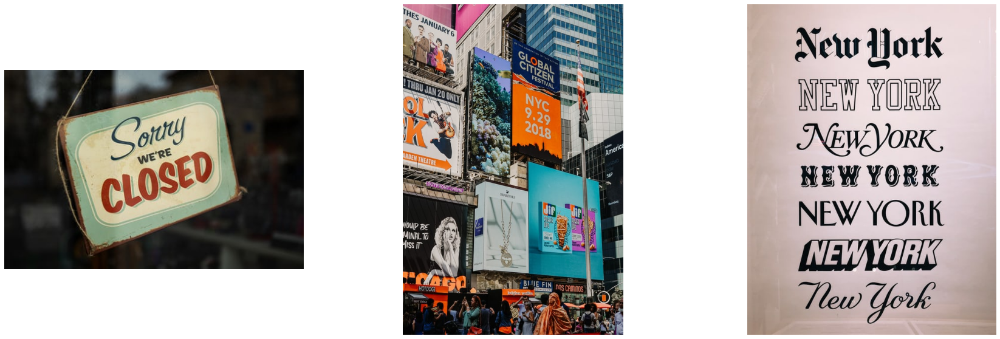

In [ ]:
urls = [
       'https://images.unsplash.com/photo-1556327070-9661a89d51db?ixlib=rb-1.2.1&ixid=MnwxMjA3fDB8MHxzZWFyY2h8NzB8fHNpZ258ZW58MHx8MHx8&auto=format&fit=crop&w=500&q=60',
       'https://images.unsplash.com/photo-1553096442-8fe2118fb927?ixlib=rb-1.2.1&ixid=MnwxMjA3fDB8MHxzZWFyY2h8MXx8YWR2ZXJ0aXNlbWVudHxlbnwwfHwwfHw%3D&auto=format&fit=crop&w=500&q=60',
       'https://images.unsplash.com/photo-1522896696058-236b2f7fb361?ixlib=rb-1.2.1&ixid=MnwxMjA3fDB8MHxzZWFyY2h8NDl8fGFkdmVydGlzZW1lbnR8ZW58MHx8MHx8&auto=format&fit=crop&w=500&q=60'
]

imgs = list(map(url_to_image, urls))

fig, ax = plt.subplots(1, 3, figsize=(30,10))
ax = ax.flatten()

for idx, img in enumerate(imgs):
  ax[idx].imshow(img)
  ax[idx].axis(False)
  path = f'{idx}.png'
  cv2.imwrite(path, cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

### Get a Keras-OCR Pipeline & Image

In [ ]:
pipeline = keras_ocr.pipeline.Pipeline()

Looking for /root/.keras-ocr/craft_mlt_25k.h5
Looking for /root/.keras-ocr/crnn_kurapan.h5


In [ ]:
prediction_groups = [pipeline.recognize([img]) for img in imgs]

In [ ]:
import glob

path_img = [i for i in glob.glob('*.jpg')]
path_img[:2]

[' (8).jpg', ' (9).jpg']

In [ ]:
images = list(map(cv2.imread, path_img))
len(images)

12

In [ ]:
def cvt(img):
  return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

In [ ]:
images = list(map(cvt, images))
prediction_groups = [pipeline.recognize([img]) for img in images]
len(prediction_groups), prediction_groups[0][0] is None

(12, False)

### Keras Result

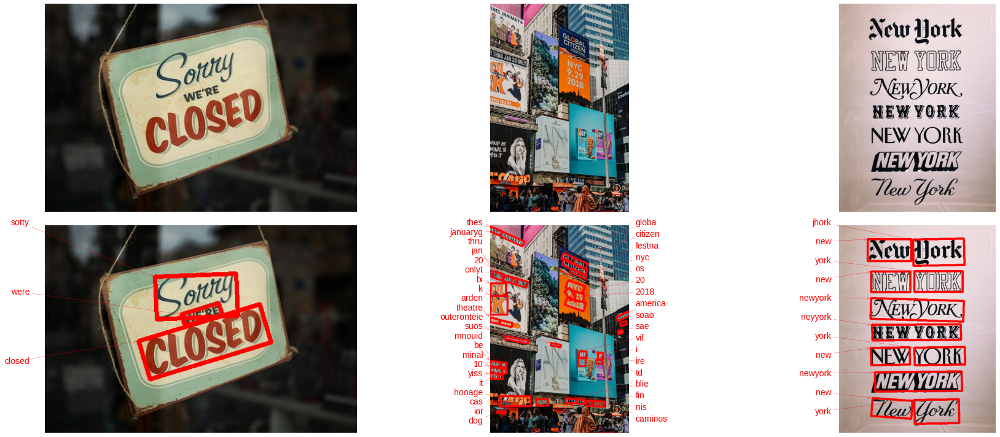

In [ ]:
fig, ax = plt.subplots(2, 3, figsize=(26, 10))

for idx, (img, pred) in enumerate(zip(images[:3], prediction_groups[:3])):
  ax[0][idx].imshow(img)
  ax[0][idx].axis(False)
  keras_ocr.tools.drawAnnotations(image=img, 
                                    predictions=pred[0], ax=ax[1][idx])
  ax[1][idx].axis(False)
  
plt.tight_layout()
plt.savefig('1.png')

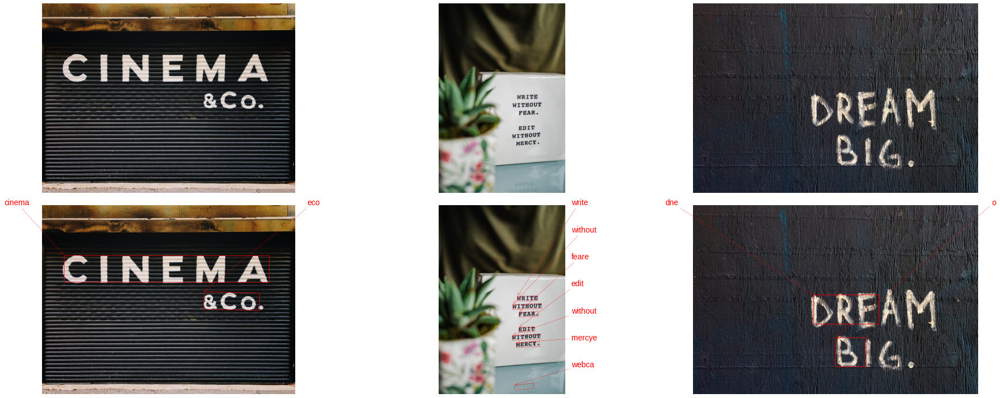

In [ ]:
fig, ax = plt.subplots(2, 3, figsize=(26, 10))

for idx, (img, pred) in enumerate(zip(images[3:6], prediction_groups[3:6])):
  ax[0][idx].imshow(img)
  ax[0][idx].axis(False)
  keras_ocr.tools.drawAnnotations(image=img, 
                                    predictions=pred[0], ax=ax[1][idx])
  ax[1][idx].axis(False)
  
plt.tight_layout()
plt.savefig('2.png')

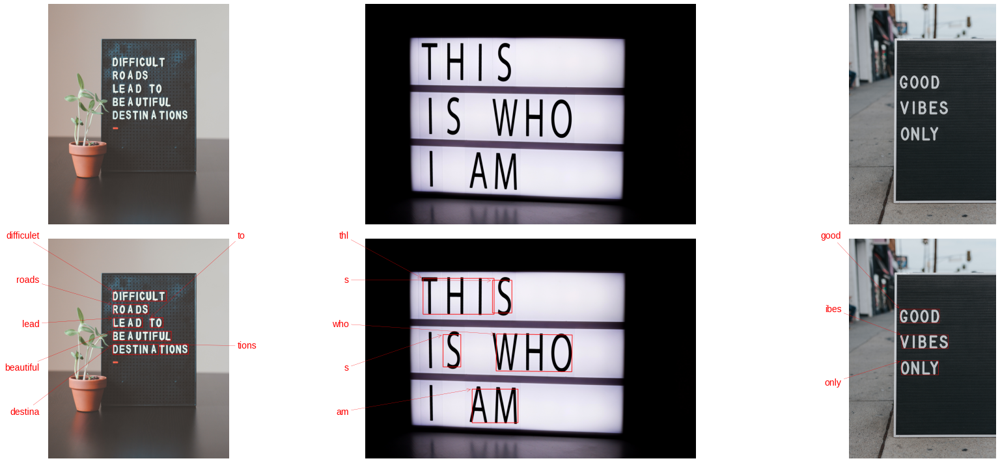

In [ ]:
fig, ax = plt.subplots(2, 3, figsize=(26, 10))

for idx, (img, pred) in enumerate(zip(images[6:9], prediction_groups[6:9])):
  ax[0][idx].imshow(img)
  ax[0][idx].axis(False)
  keras_ocr.tools.drawAnnotations(image=img, 
                                    predictions=pred[0], ax=ax[1][idx])
  ax[1][idx].axis(False)
  
plt.tight_layout()
plt.savefig('3.png')

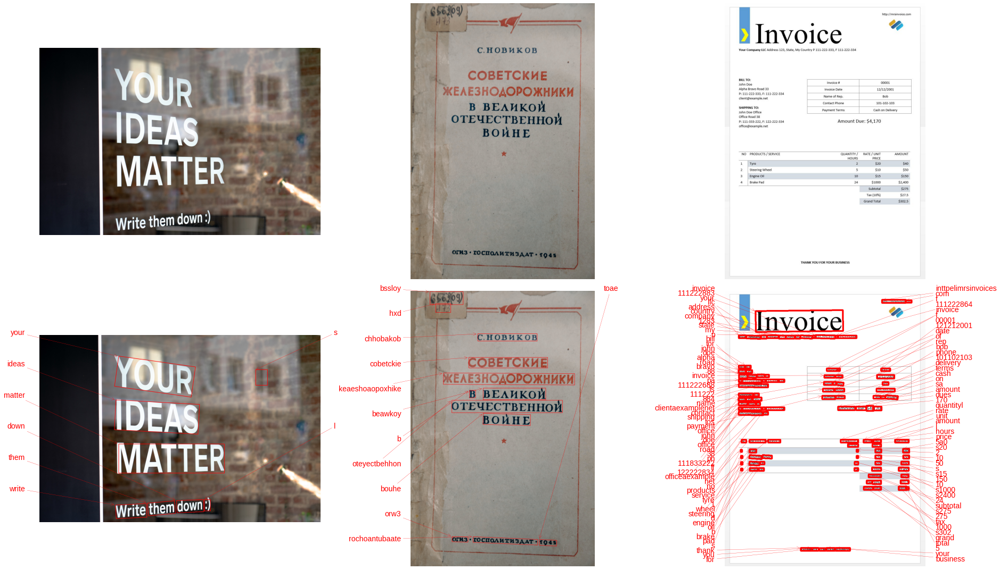

In [ ]:
fig, ax = plt.subplots(2, 3, figsize=(26, 15))

for idx, (img, pred) in enumerate(zip(images[9:], prediction_groups[9:])):
  ax[0][idx].imshow(img)
  ax[0][idx].axis(False)
  keras_ocr.tools.drawAnnotations(image=img, 
                                    predictions=pred[0], ax=ax[1][idx])
  ax[1][idx].axis(False)
  
plt.tight_layout()
plt.savefig('4.png')

### Tesseract

In [ ]:
import os
import pytesseract
from PIL import Image
from pytesseract import Output
import matplotlib.pyplot as plt

# OCR Engine modes(–oem):
# 0 - Legacy engine only.
# 1 - Neural nets LSTM engine only.
# 2 - Legacy + LSTM engines.
# 3 - Default, based on what is available.

# Page segmentation modes(–psm):
# 0 - Orientation and script detection (OSD) only.
# 1 - Automatic page segmentation with OSD.
# 2 - Automatic page segmentation, but no OSD, or OCR.
# 3 - Fully automatic page segmentation, but no OSD. (Default)
# 4 - Assume a single column of text of variable sizes.
# 5 - Assume a single uniform block of vertically aligned text.
# 6 - Assume a single uniform block of text.
# 7 - Treat the image as a single text line.
# 8 - Treat the image as a single word.
# 9 - Treat the image as a single word in a circle.
# 10 - Treat the image as a single character.
# 11 - Sparse text. Find as much text as possible in no particular order.
# 12 - Sparse text with OSD.
# 13 - Raw line. Treat the image as a single text line, bypassing hacks that are Tesseract-specific.

def crop_word_regions(image_path='./images/sample.png', output_path='./output'):
    if not os.path.exists(output_path):
        os.mkdir(output_path)
    custom_oem_psm_config = r'--oem 3 --psm 3'
    image = Image.open(image_path)

    recognized_data = pytesseract.image_to_data(
        image, lang='eng',    # 한국어라면 lang='kor'
        config=custom_oem_psm_config,
        output_type=Output.DICT
    )
    
    top_level = max(recognized_data['level'])
    index = 0
    cropped_image_path_list = []
    for i in range(len(recognized_data['level'])):
        level = recognized_data['level'][i]
    
        if level == top_level:
            left = recognized_data['left'][i]
            top = recognized_data['top'][i]
            width = recognized_data['width'][i]
            height = recognized_data['height'][i]
            
            output_img_path = os.path.join(output_path, f"{str(index).zfill(4)}.png")
            print(output_img_path)
            cropped_image = image.crop((
                left,
                top,
                left+width,
                top+height
            ))
            cropped_image.save(output_img_path)
            cropped_image_path_list.append(output_img_path)
            index += 1
    return cropped_image_path_list


work_dir = '/content/drive/MyDrive/Ex/Ex-12'
img_file_path = work_dir + '/(12).jpg'   #테스트용 이미지 경로입니다. 본인이 선택한 파일명으로 바꿔주세요. 

cropped_image_path_list = crop_word_regions(img_file_path, work_dir + '/yo')

In [ ]:
def recognize_images(cropped_image_path_list):
    custom_oem_psm_config = r'--oem 3 --psm 7'
    
    for image_path in cropped_image_path_list:
        image = Image.open(image_path)
        recognized_data = pytesseract.image_to_string(
            image, lang='eng',    # 한국어라면 lang='kor'
            config=custom_oem_psm_config,
            output_type=Output.DICT
        )
        print(recognized_data['text'])
    print("Done")

# 위에서 준비한 문자 영역 파일들을 인식하여 얻어진 텍스트를 출력합니다.
# recognize_images(cropped_image_path_list)

___
___
# 회고

![](https://velog.velcdn.com/images/jujemu/post/82998dce-1e1d-4944-929e-a35cfcd5fa99/image.png)

# 내용 요약
# OCR
_Optical Character Recognition_

There are two parts in OCR.

1. Text Detection
2. Text Recognition

## Text Detection
### Paper related
Scene Text Detection with Polygon Offsetting and Border Augmentation

#### Regression-based
SSD: Single shot detector _https://arxiv.org/abs/1512.02325_

TextBoxes _https://arxiv.org/abs/1611.06779_

#### Segmentation-based
_in today's paper, it is popular and can be trained stably._
PixelLink

#### End to End
_including Text Detection and Text Recognition_
FOTS

### vs Object Detection
_OCR is more complex than object detection_

__the reason is__
1. high density
2. similar characters; i, I, T, l
3. a lot of languages


## Text Recognition
CRNN
GRCNN

## code
### keras-ocr
https://keras-ocr.readthedocs.io/en/latest/index.html

하지만 밑의 github을 추천한다.
https://github.com/faustomorales/keras-ocr

### tesseract

# 참고 자료
https://tv.naver.com/v/4578167  
https://github.com/clovaai/CRAFT-pytorch  
https://blogs.sas.com/content/saskorea/2018/12/21/  딥러닝을-활용한-객체-탐지-알고리즘-이해하기/  


# 분석

keras-ocr은 end to end pipeline을 통해  

쾌적한 사용환경을 제공한다.  

그러나 여전히 인식률에서는 실망스러운 결과를 보였다.  

필기체와 폰트에 따라서 글자간격이 다른 경우 한 단어로 인식하지 못하거나  

아예 인식하지 못하거나 다른 글자로 인식하는 경우가 잦았다.  

이에 직접 구현하고 싶은 생각이 들었다.  

OCR을 보자 도서관에서 흔히 보는 바코드 생각이 났다.  

이미지에서 정보를 얻기 위해서는 예전에는 바코드처럼 약속된 형식으로부터 얻을 수 있었지만  

이제는 DL OCR을 통해 발전된 모델을 사용하면 쉽게 실생활에서 응용이 가능하다.  

___

Tesseract는 아무것도 인식하지 못하는 것처럼 보였으나,  

report나 receipt처럼 바로 세워진 글자의 경우에는 인식하는 것으로 보인다.  

그러나 대부분의 상황에서 문제를 해결하지 못함으로 실생활에 활용하기는 어려워 보인다.  



## 정리

현재 두 모델에서 주요하게 봐야할 점

1. 기울어진 글자를 인식할 수 있나
2. 폰트에 따른 글자간격을 해결하여 하나의 단어로 인식할 수 있나
3. 필기체를 올바르게 인식할 수 있나
4. 소요된 시간